In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam
import os

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


# Data

In [3]:
from google.colab import files
data_to_load = files.upload()

Saving winequality-red.csv to winequality-red.csv


In [4]:
import io
df = pd.read_csv(io.BytesIO(data_to_load['winequality-red.csv']))

In [ ]:

df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
df.describe()

# Model

In [5]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import to_categorical

# The target variable is 'quality'.
target = 'quality'
Y = df[target]
X = df.drop(target, axis = 1)

print('Labels:', np.unique(Y))

# Data normalization
# X = MinMaxScaler().fit_transform(X)
X = StandardScaler().fit_transform(X)

# One-hot encoding
Y = Y - Y.min()
Y = to_categorical(Y)

# Dimensions
num_samples = X.shape[0]
num_feats = X.shape[1]
num_classes = Y.shape[1]

print('Classes:', num_classes)
print('Samples:', num_samples)
print('Features:', num_feats)


# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

Labels: [3 4 5 6 7 8]
Classes: 6
Samples: 1599
Features: 11


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                768       
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 198       
Total params: 3,046
Trainable params: 3,046
Non-trainable params: 0
_________________________________________________________________


[]

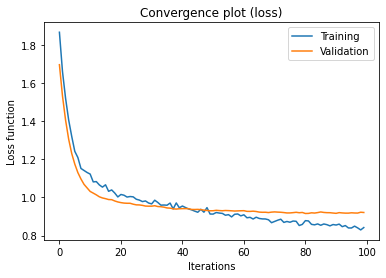

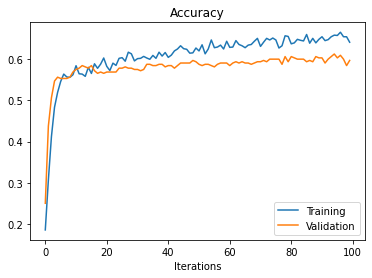

In [6]:
from keras import backend as K
from keras.wrappers.scikit_learn import KerasClassifier
K.clear_session()

# learning rate
learning_rate = 1e-3

# 2 layers NN model
def twoLayerFeedForward():
  model = Sequential()
  model.add(Dense(64, input_dim=num_feats, activation='relu'))
  model.add(Dense(32, activation='relu'))
  model.add(Dropout(0.5))
  model.add(Dense(num_classes, activation='softmax'))
  model.summary()
  model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate), metrics=["accuracy"])
  return model

# training
model = KerasClassifier(twoLayerFeedForward, epochs=100, batch_size=500, verbose=0)
info = model.fit(X_train, Y_train, epochs=100, batch_size=128, validation_data=(X_test, Y_test), verbose=0)

# Convergence plot
plt.figure()
plt.plot(info.history['loss'], label='Training')
plt.plot(info.history['val_loss'], label='Validation')
plt.title('Convergence plot (loss)')
plt.xlabel('Iterations')
plt.ylabel('Loss function')
plt.legend()
plt.plot()

# Accuracy plot
plt.figure()
plt.plot(info.history['accuracy'], label='Training')
plt.plot(info.history['val_accuracy'], label='Validation')
plt.title('Convergence plot (accuracy)')
plt.xlabel('Iterations')
plt.title('Accuracy')
plt.legend()
plt.plot()

In [7]:
if isinstance(X_test, np.ndarray):
  X_test = pd.DataFrame(X_test, columns=["col{}".format(k) for k in range(X_test.shape[1])])
if isinstance(X_train, np.ndarray):
  X_train = pd.DataFrame(X_train, columns=["col{}".format(k) for k in range(X_train.shape[1])])
if isinstance(Y_test, np.ndarray):
  Y_test = pd.DataFrame(Y_test, columns=["col{}".format(k) for k in range(Y_test.shape[1])])
if isinstance(Y_train, np.ndarray):
  Y_train = pd.DataFrame(Y_train, columns=["col{}".format(k) for k in range(Y_train.shape[1])])

# PDP

https://www.kaggle.com/dansbecker/partial-plots

In [ ]:
!pip install pdpbox

     |████████████████████████████████| 57.7MB 66kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.0-cp36-none-any.whl size=57690722 sha256=66eaf84995ce2304f3b834ed1269b9ea7fe7f1c924f7d8e456d53cef2285c745
  Stored in directory: /root/.cache/pip/wheels/7d/08/51/63fd122b04a2c87d780464eeffb94867c75bd96a64d500a3fe
Successfully built pdpbox


In [ ]:
from pdpbox import pdp, get_dataset, info_plots

In [ ]:
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag)
    plt.show()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


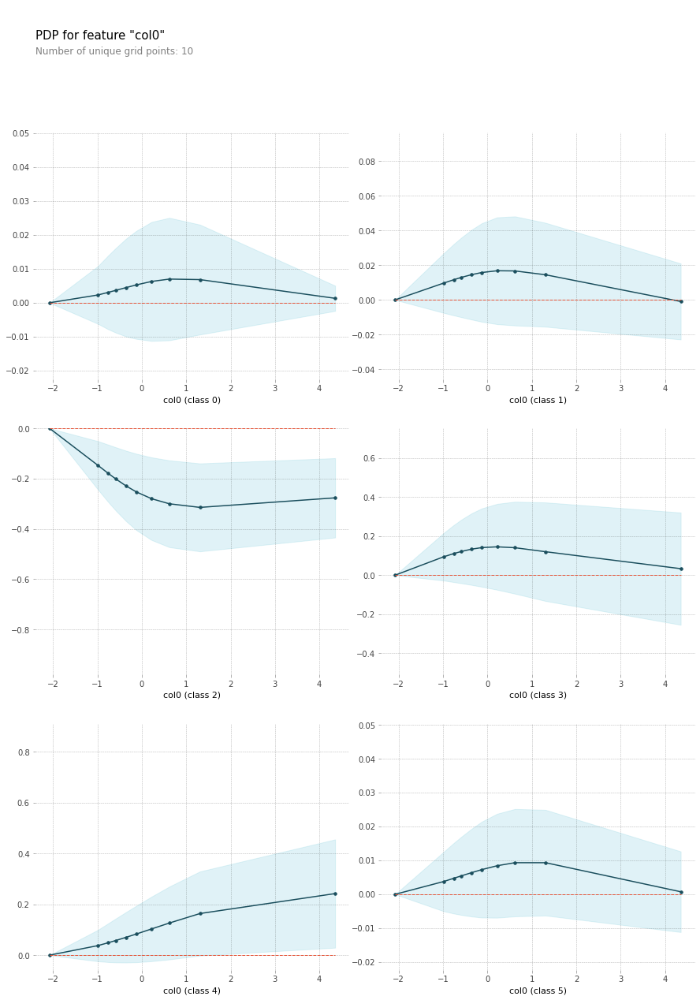

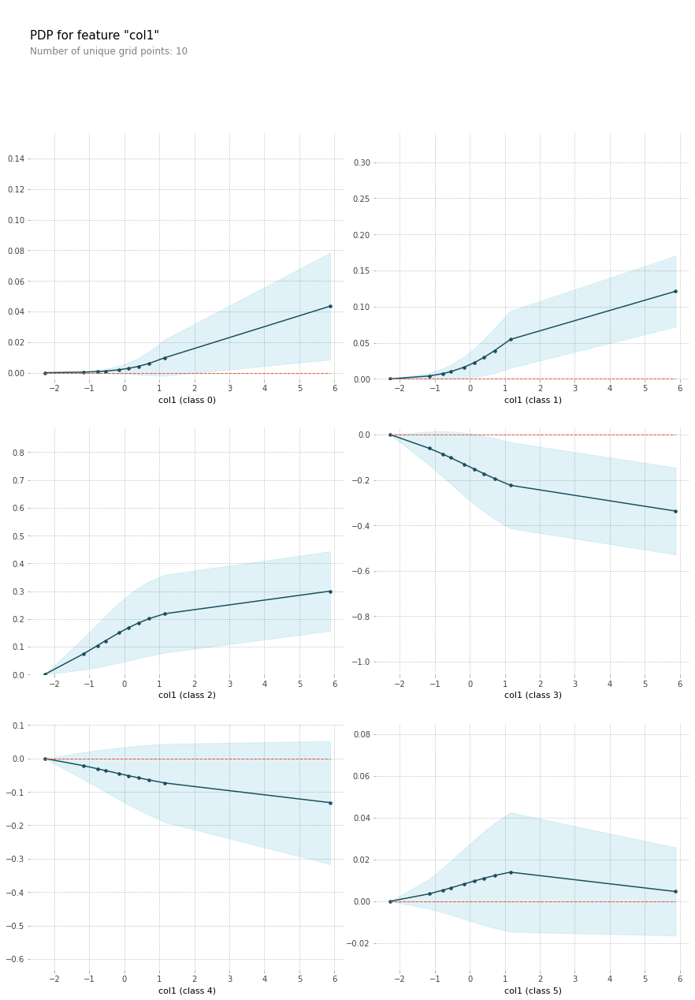

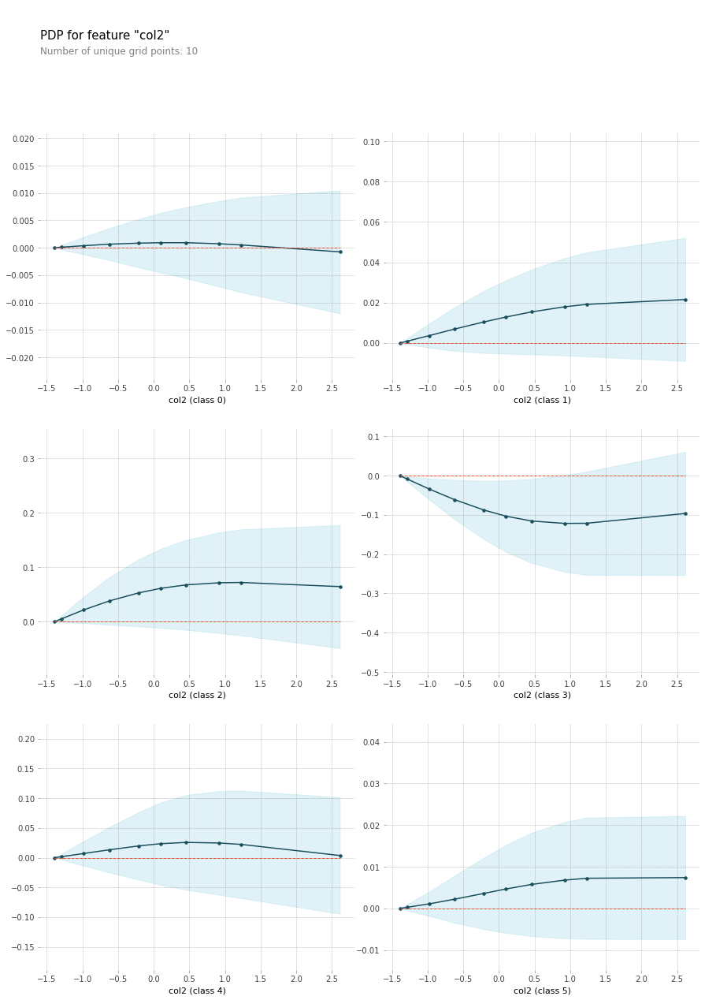

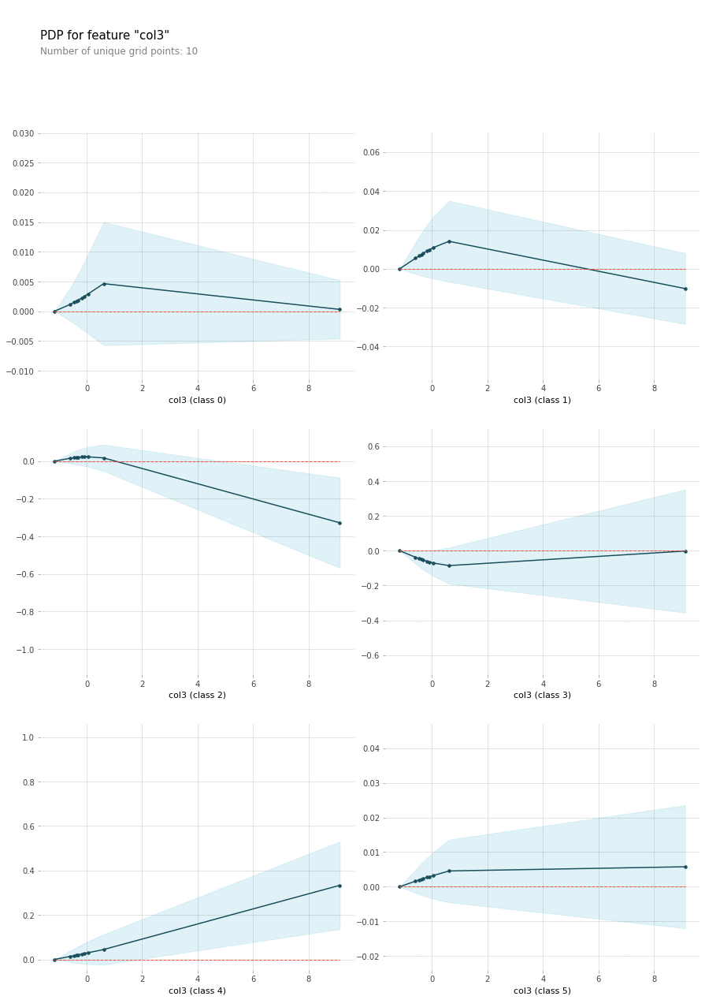

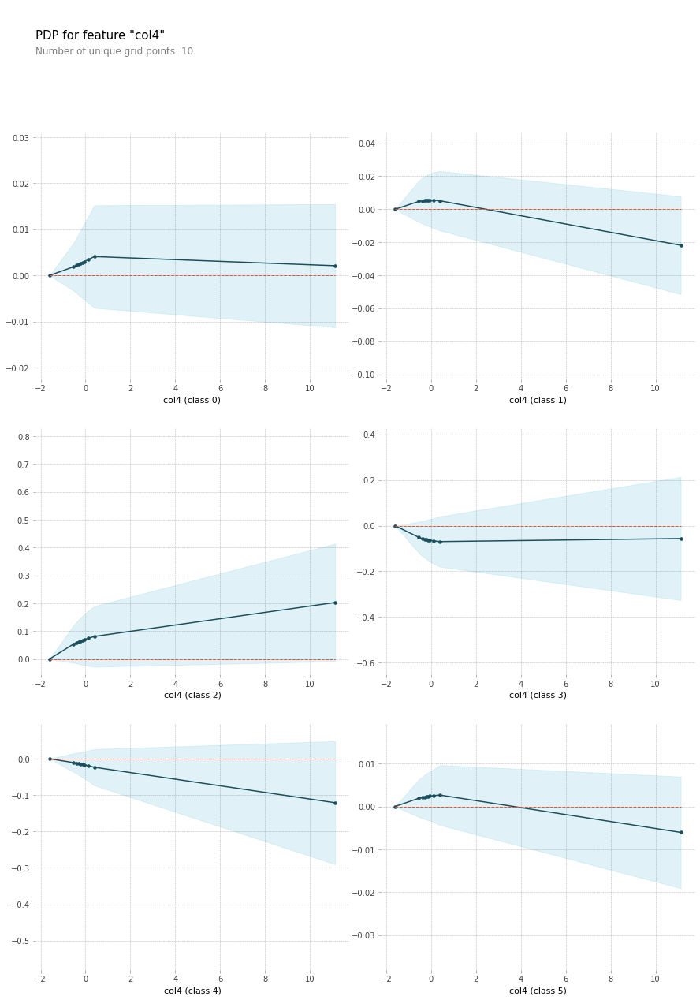

...

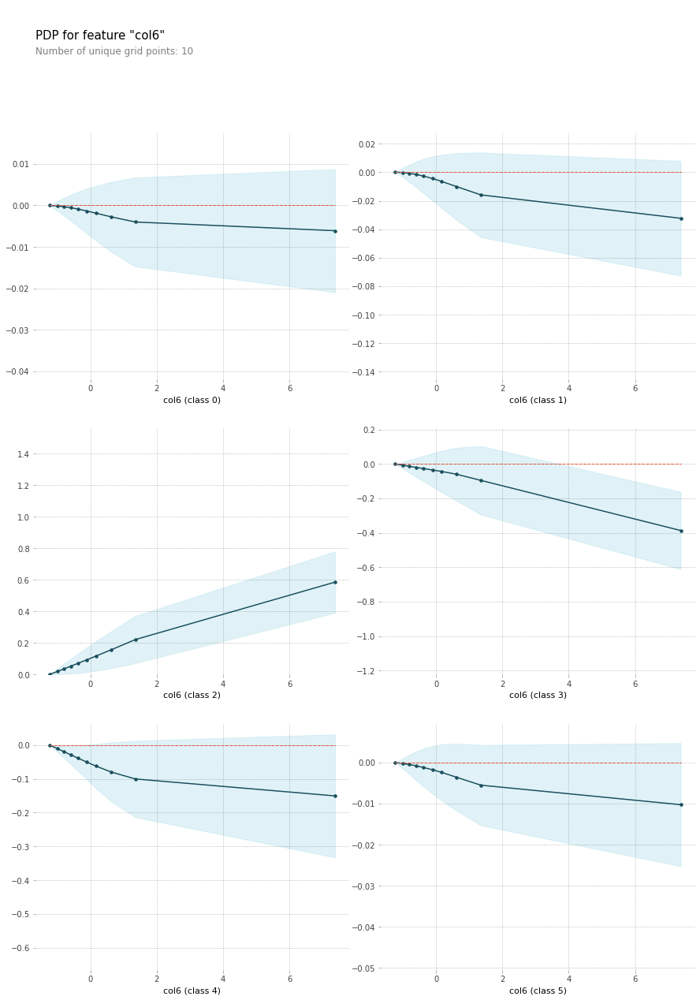

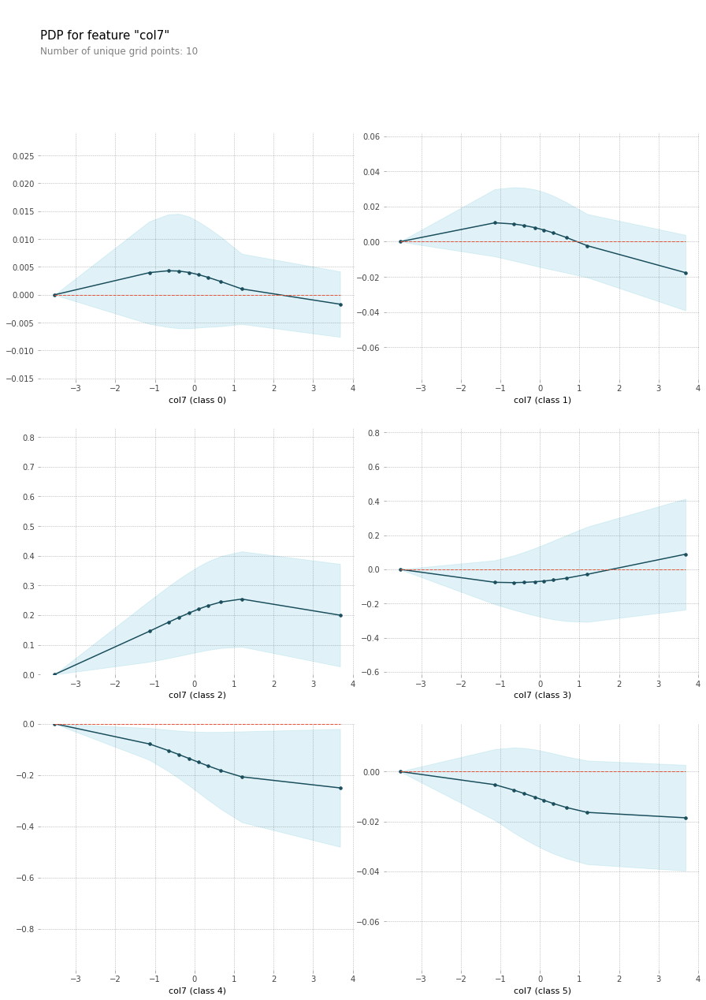

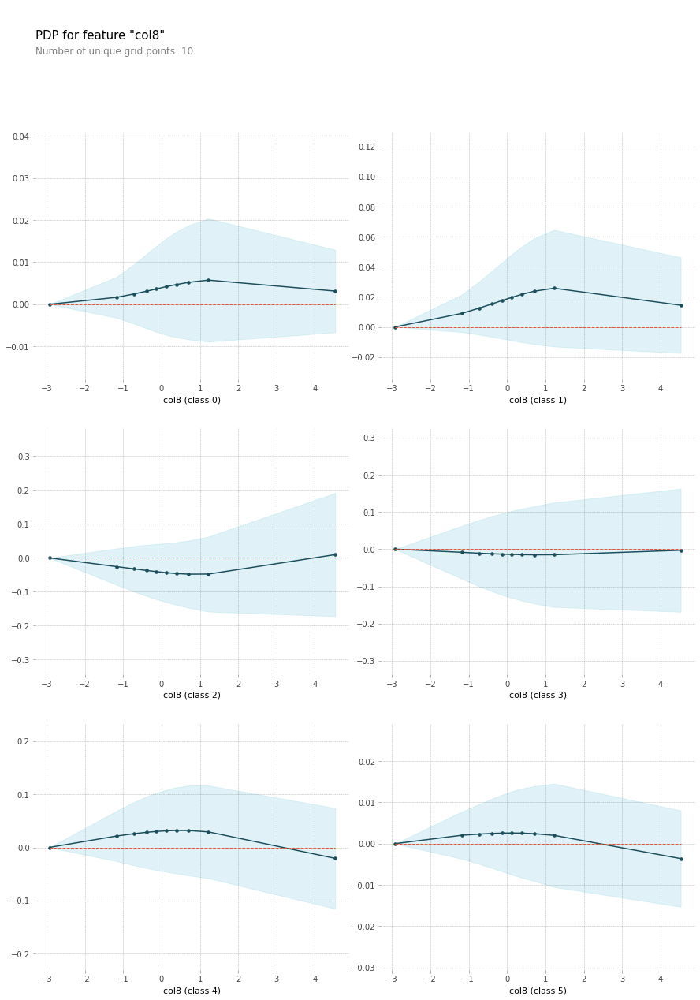

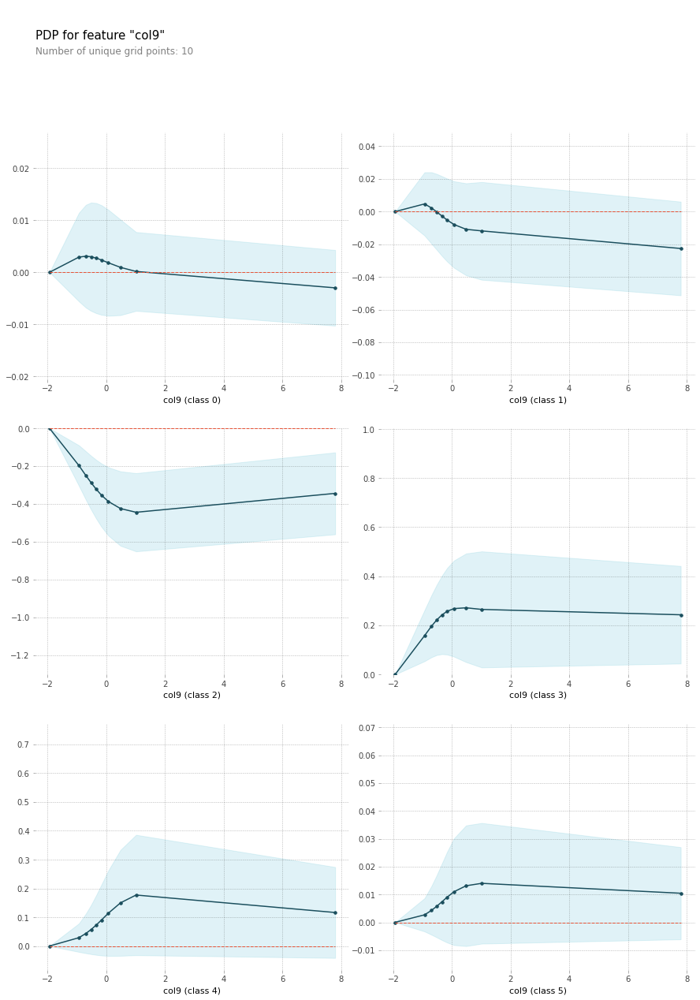

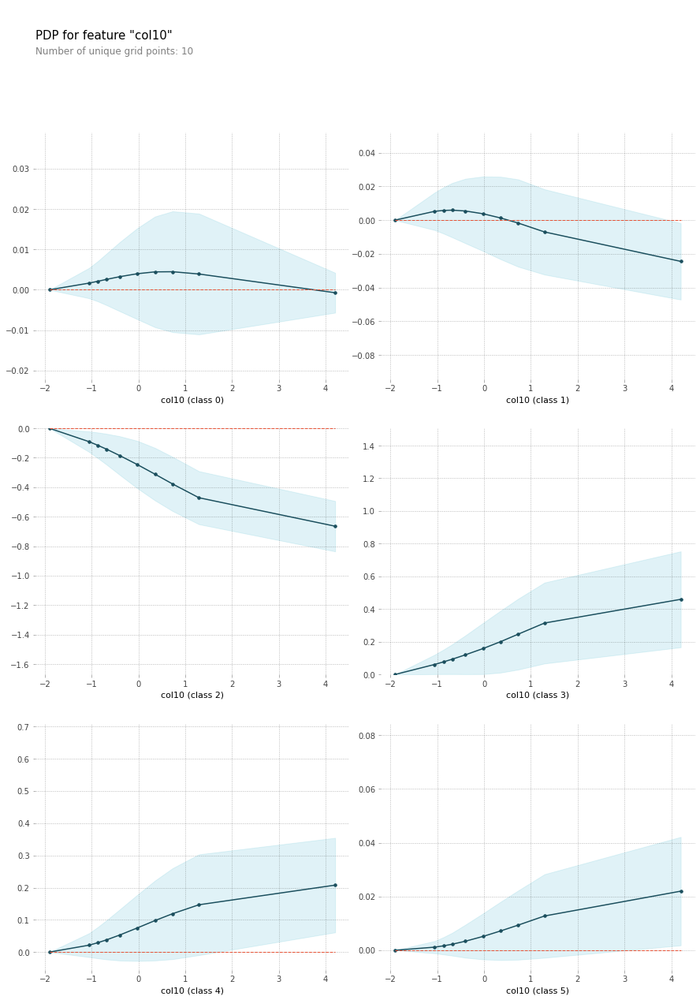

In [ ]:
for column in X_train.columns :

  plot_pdp(model, X_train, column)

# ICE

http://savvastjortjoglou.com/intrepretable-machine-learning-nfl-combine.html

https://stackoverflow.com/questions/60164019/pycebox-iceplot-does-not-work-on-xgboost-while-work-on-random-forest

In [ ]:
!pip install pycebox

In [ ]:
from pycebox.ice import ice, ice_plot

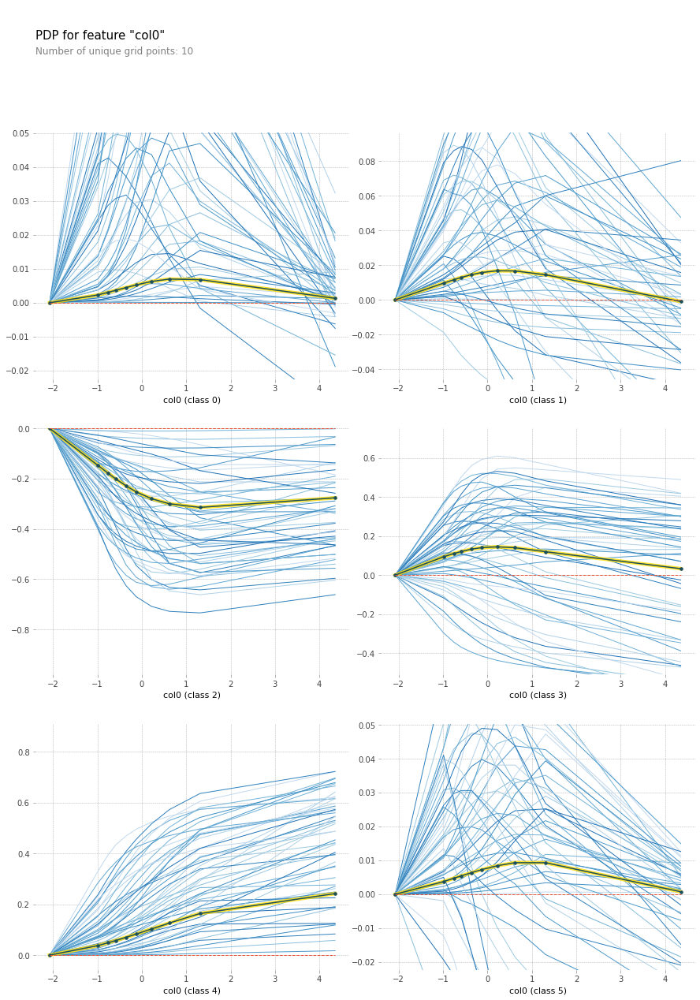

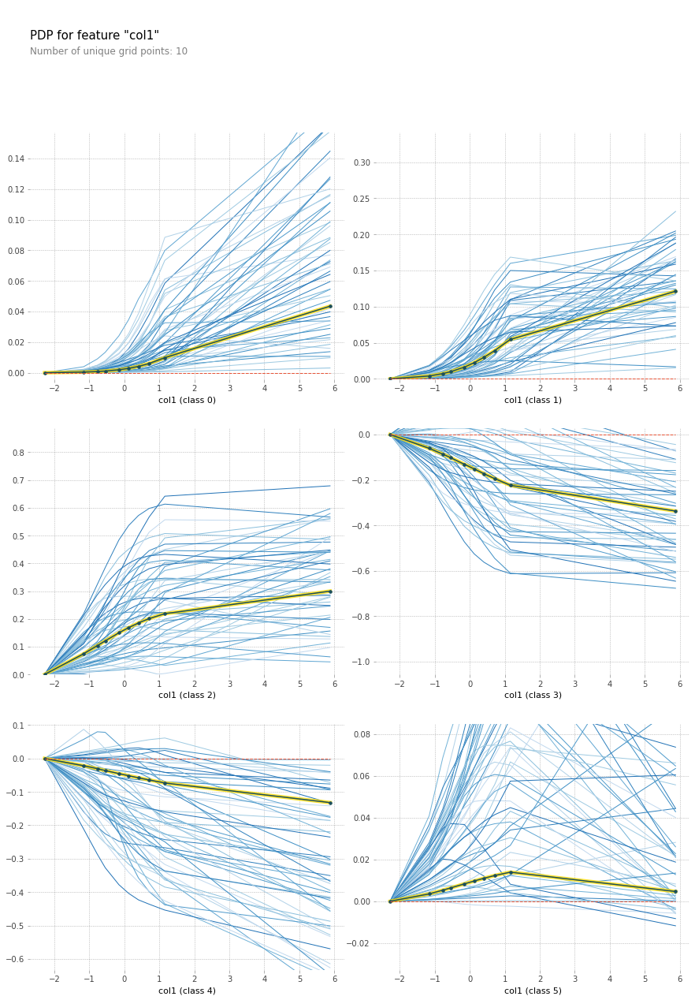

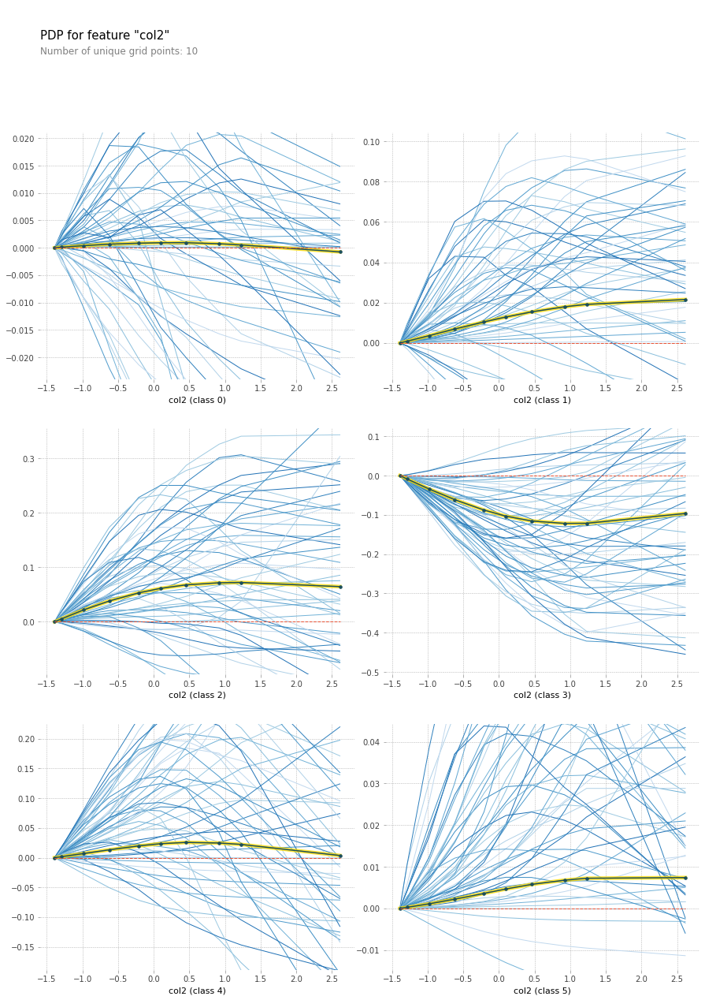

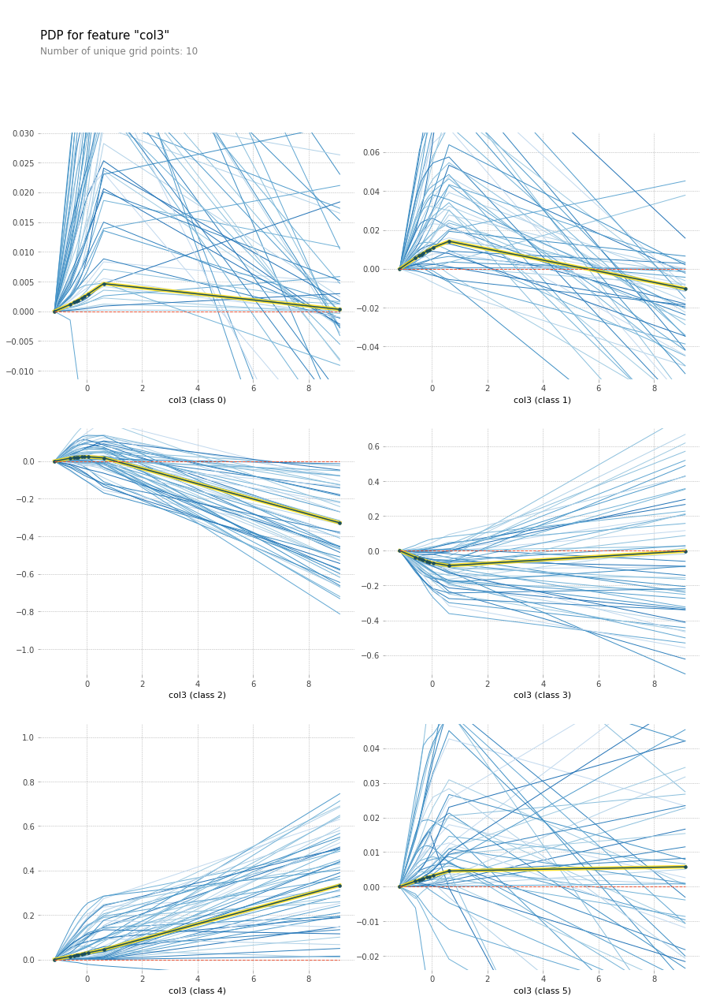

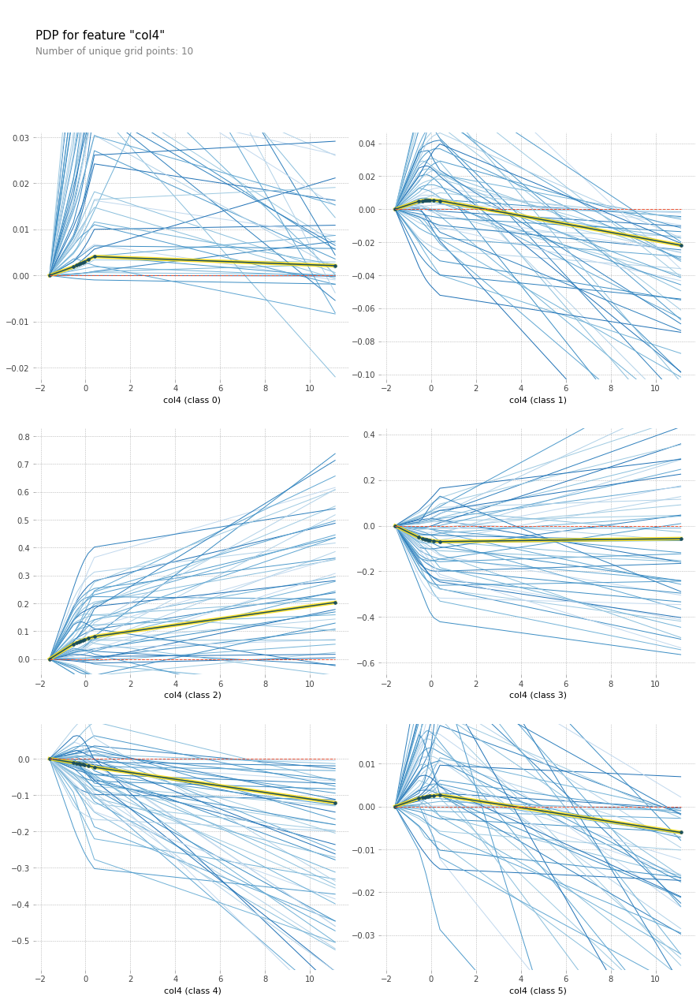

...

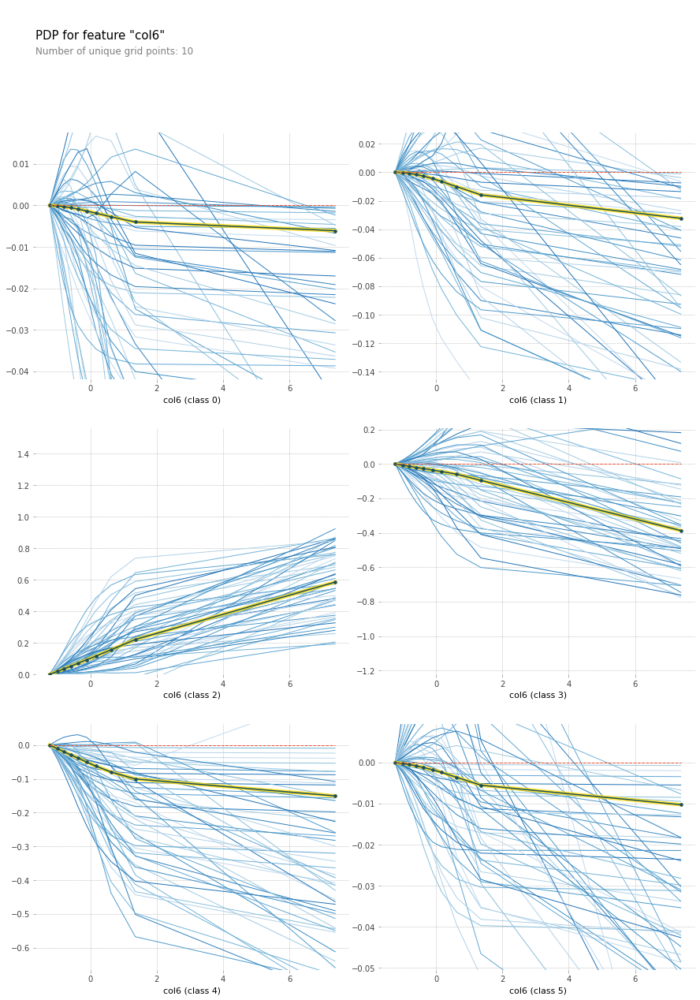

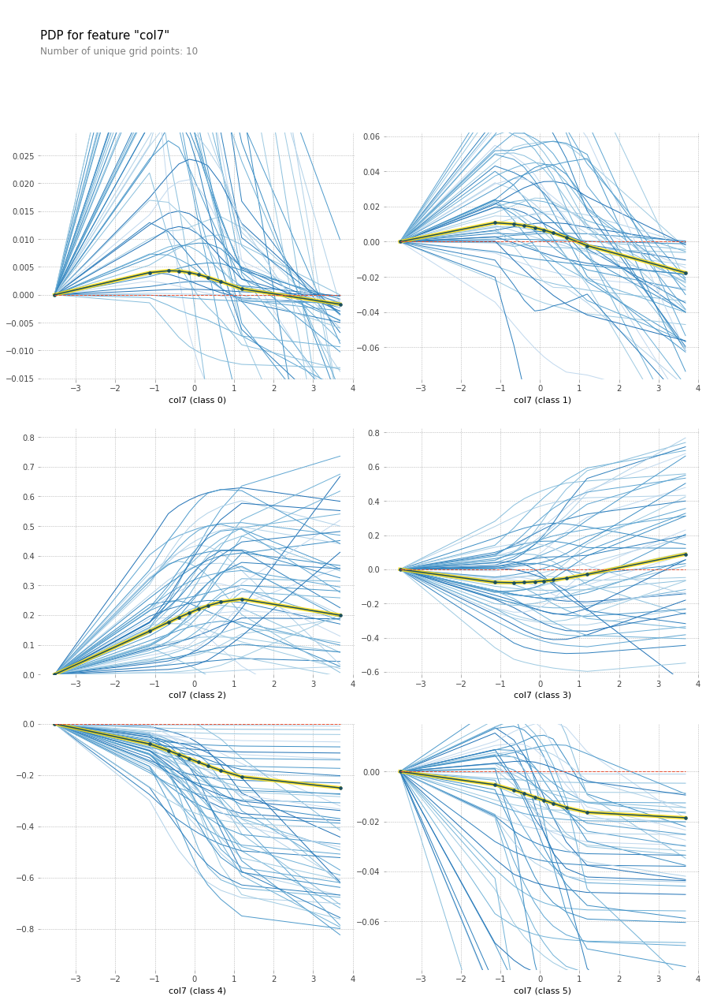

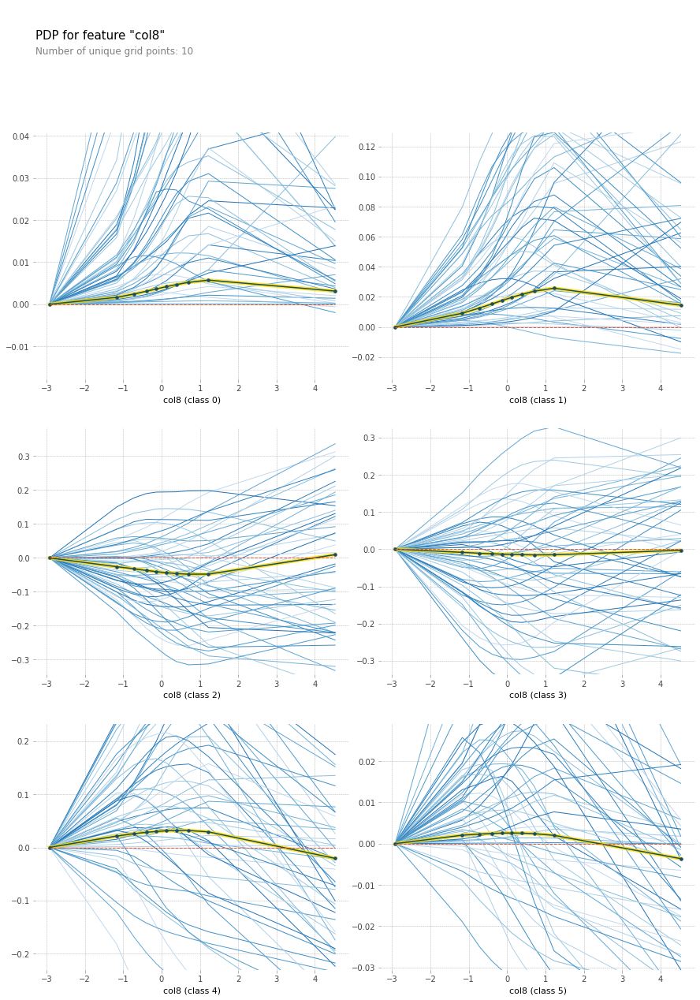

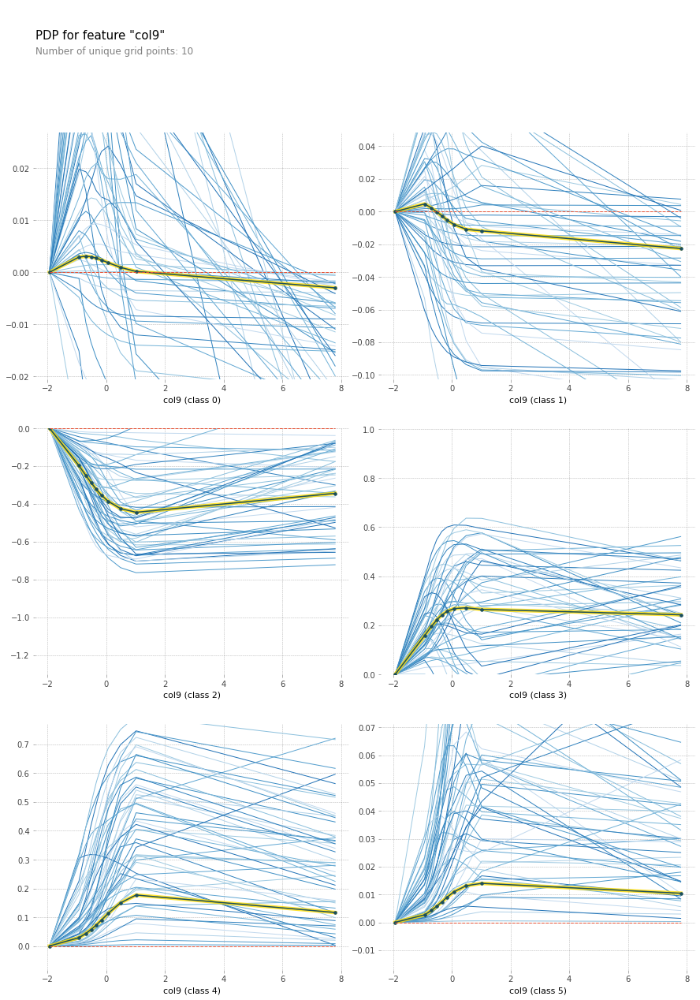

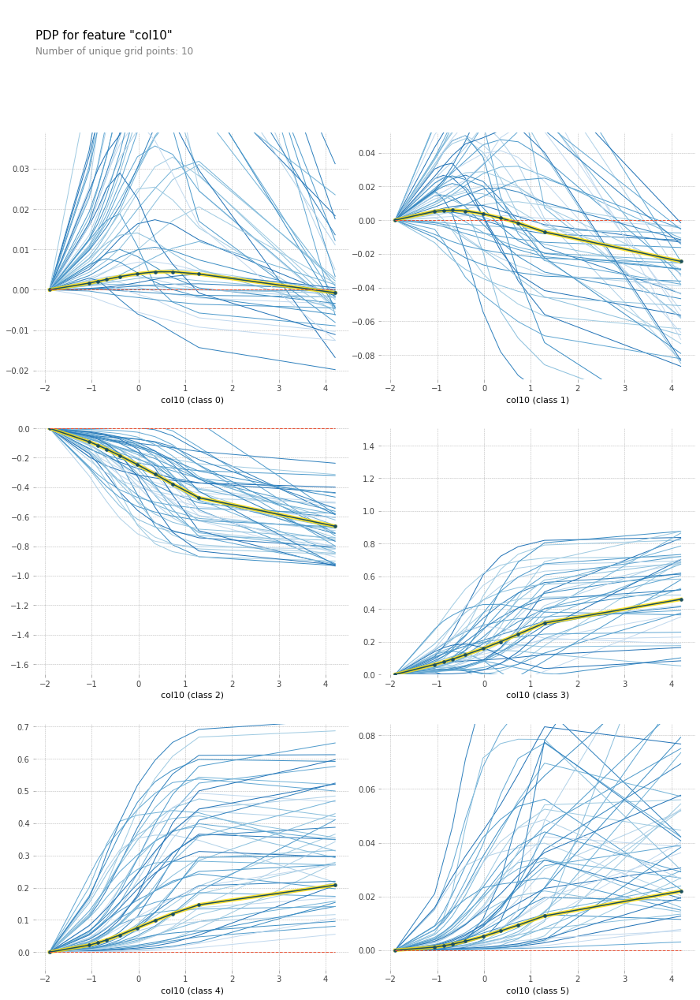

In [ ]:
for column in X_train.columns :
  plot_pdp(model, X_train, column, cluster_flag=True, nb_clusters=50, lines_flag=True)

# Permutation importance

https://www.kaggle.com/dansbecker/permutation-importance

In [ ]:
!pip install eli5

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

In [ ]:
perm = PermutationImportance(model, random_state=1).fit(X_test, Y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1056 ± 0.0251,col10
0.0763 ± 0.0429,col9
0.0500 ± 0.0205,col2
0.0494 ± 0.0195,col6
0.0469 ± 0.0209,col7
0.0413 ± 0.0165,col1
0.0294 ± 0.0184,col8
0.0262 ± 0.0226,col0
0.0238 ± 0.0226,col3
0.0088 ± 0.0061,col4


# SHAP

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

In [8]:
!pip install shap

     |████████████████████████████████| 276kB 3.3MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394116 sha256=23ae0b284749328ed9c1a74133eadbabad4f100f177423849939e16dbcdcdd1a
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [9]:
import shap

In [10]:
train_stats = X_train.describe()
train_stats = train_stats.transpose()

def norm(x):
  return (x - train_stats['mean']) / train_stats['std']

df_train_normed = norm(X_train)

In [11]:
df_train_normed_summary = shap.kmeans(df_train_normed.values, 25)

explainer = shap.KernelExplainer(model.predict, df_train_normed_summary)

shap_values = explainer.shap_values(df_train_normed.values)

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!


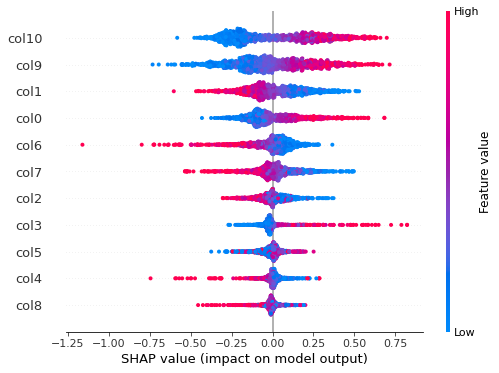

In [ ]:
shap.summary_plot(shap_values, X_train)

Dependance plot on SHAP :

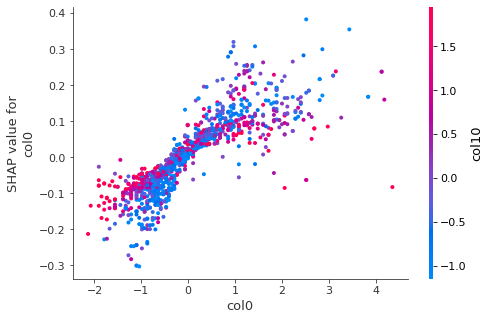

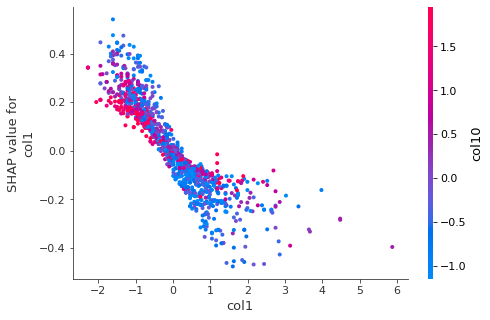

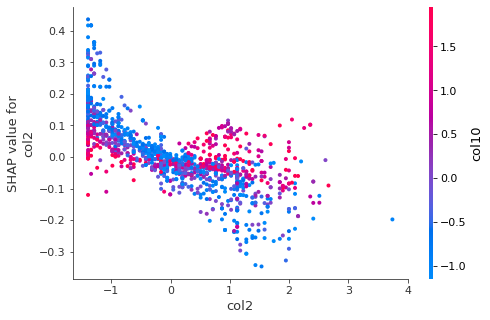

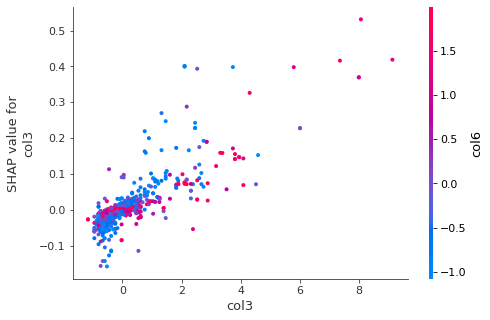

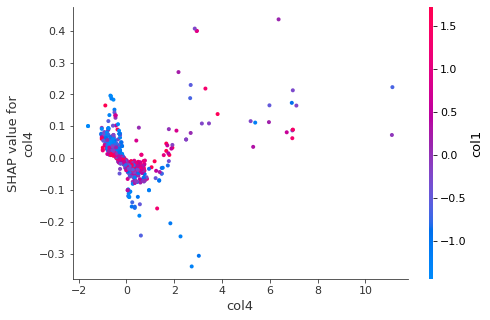

...

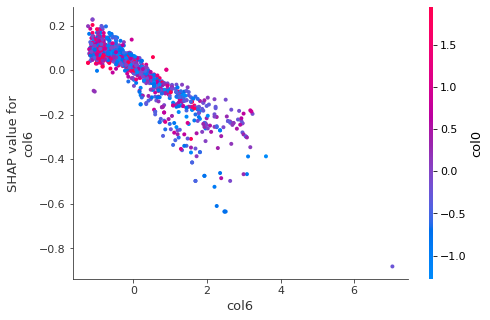

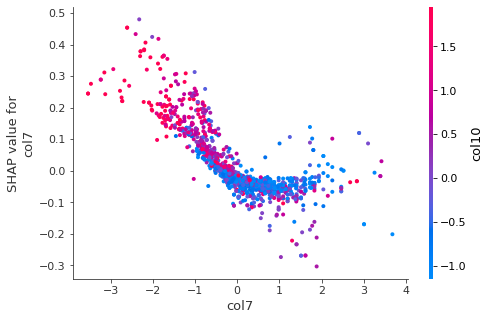

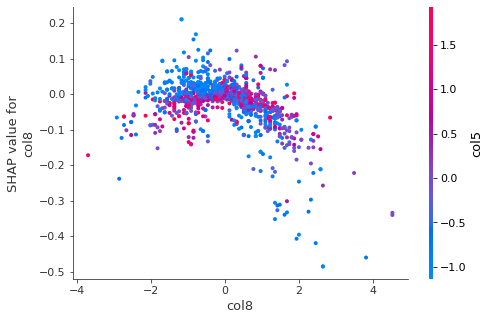

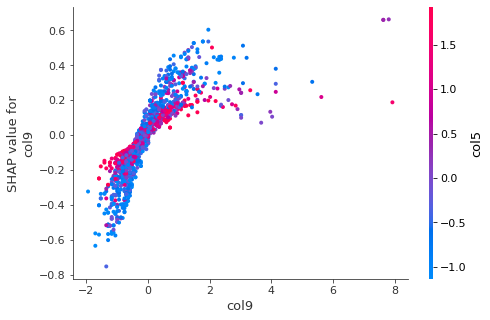

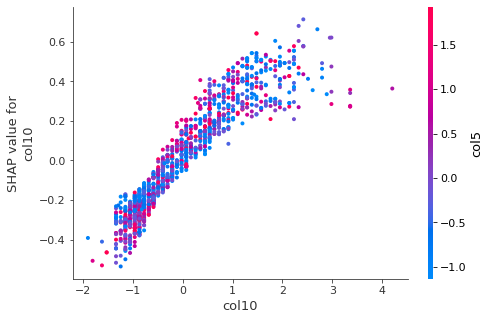

In [16]:
for column in X_train.columns :

  if isinstance(shap_values, list) :

    for classe in range(len(shap_values)) :

      shap.dependence_plot(column, shap_values[classe], X_train)

  else :
    
    shap.dependence_plot(column, shap_values, X_train)

# Feature importance


https://www.kaggle.com/bersk91/uni-analytics-datadragons/notebook

https://machinelearningmastery.com/calculate-feature-importance-with-python/

https://www.analyticsvidhya.com/blog/2019/08/decoding-black-box-step-by-step-guide-interpretable-machine-learning-models-python/


In [ ]:
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

AttributeError: ignored

# LIME

https://blog.octo.com/introduction-a-linterpretation-de-modeles-de-machine-learning/

In [ ]:
!pip install lime

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression',training_labels=Y_train, 
                                                   feature_names=df.columns)
explanation = explainer.explain_instance(X_test.values[0], model.predict)
explanation.show_in_notebook()